# Peceptron

# Q.2

### Importing Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets
from sklearn.datasets import make_blobs
import seaborn as sns

### Data Generation

### Using the make blobs function in sklearn generate a dataset of 100 points with two classes.

In [2]:
# generate 100 samples with 2 features and 2 centers
# centers represent the number of classes in the dataset
# center_box is a tuple that defines the minimum and maximum coordinates for the cluster centers
# random_state is a parameter that controls the random number generator used by the function
X, y = datasets.make_blobs(n_samples=100, centers=2, n_features=2,   
                  center_box=(0, 10), random_state=1000)

In [14]:
print(np.unique(y))

[-1  1]


### Change the label for class 0 to -1

In [4]:
y[y == 0] = -1

In [5]:
print(np.unique(y))

[-1  1]


### Visualize the generated data using scatter plot.

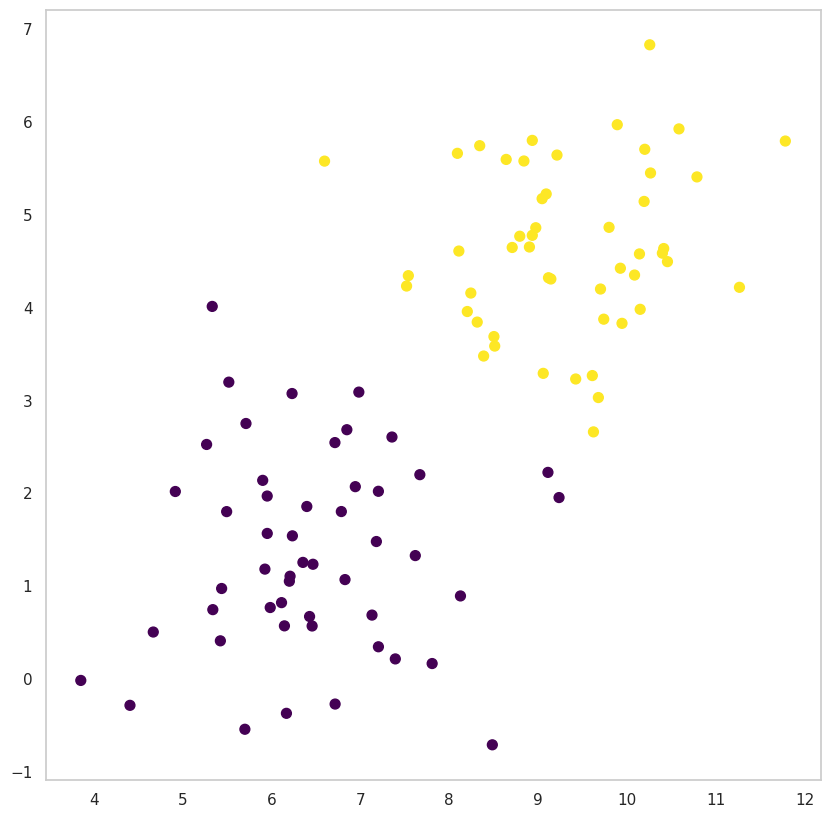

In [6]:
# Plot the data
sns.set()  # Set the style of the plot
sns.set_style("whitegrid")  # Set the style of the plot
# set figure size
# Create a figure object and set the size of the figure
plt.figure(figsize=(10, 10))
# turn grid off
plt.grid(False)  # Turn off the gridlines
# turn scale off
# Create a scatter plot of the data points
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis')
plt.show()  # Show the plot

### Augment the data with an extra column of 1's

We are augmenting the data by adding an extra column of 1's to the feature matrix X. This is because the perceptron algorithm works by finding a hyperplane that separates the two classes in the feature space. Mathematically, this hyperplane is represented by the equation:



w1 * x1 + w2 * x2 + ... + wn * xn + b = 0

where w1, w2, ..., wn are the weights of the hyperplane and b is the bias term. The feature vector x = [x1, x2, ..., xn] represents a data point in the feature space.

When we add an extra column of 1's to the feature matrix, we are effectively adding a new feature x0 to each data point, where x0 = 1. This allows us to represent the bias term b as a weight wn+1 corresponding to the extra feature x0, and the hyperplane equation becomes:

In [7]:
# Add a column of ones to a NumPy array X (Dataset)
X = np.c_[X, np.ones(X.shape[0])]

In [8]:
print(X[:10])

[[10.0850635   4.35004635  1.        ]
 [ 6.11302538  0.81966888  1.        ]
 [ 9.23554171  1.95209395  1.        ]
 [ 7.519972    4.23150309  1.        ]
 [ 6.2010604   1.05058773  1.        ]
 [ 7.13093136  0.68540191  1.        ]
 [10.1928101   5.14329277  1.        ]
 [ 8.20326639  3.95689153  1.        ]
 [ 7.61813666  1.32673975  1.        ]
 [ 5.95173163  1.96831913  1.        ]]


### Batch Gradient Descent Algorithm

This algorithm is similar to perceptron algorithm, but the only difference is, 
instead of updating weights in every iteration, we will store the sum of gradients and once we have iterated through all the samples in the dataset we will then update the weights.

In [9]:
# Define the Batch Gradient Descent class
class BatchDescentGradient:

    def __init__(self, learning_rate=0.5, epochs=1000000):
        # Initialize the learning rate and number of epochs
        self.learning_rate = learning_rate
        self.epochs = epochs

    def fit(self, X, y, initial_weights=None):
        # If initial weights are not provided, set them to zeros
        if initial_weights is None:
            w = np.zeros(X.shape[1])
        else:
            w = initial_weights

        # Create empty lists to store errors and weights for each epoch
        errors_list = []
        weights_list = []
        for epoch in range(self.epochs):
            # Initialize the error and delta for each epoch
            mismatch = 0
            delta = 0
            for i, x in enumerate(X):
                # If the prediction is incorrect, update the delta and error
                if (np.dot(X[i], w) * y[i]) <= 0:
                    delta -= X[i] * y[i]
                    mismatch += 1

            # Update the weights using the delta and learning rate
            w -= self.learning_rate * delta
            errors_list.append(mismatch)
            weights_list.append(list(w))

            # Print the error every 10 epochs
            if epoch % 10 == 0:
                print(f"Iteration {epoch} with error = {mismatch}")

            # If the error is 0, exit the loop
            if e == 0:
                break

        # Print the final error and return the weights and errors
        print(f"Iteration {epoch} with error = {mismatch}")
        return weights_list, errors_list


In [10]:
# Set the learning rate to 0.01
learning_rate = 0.01

# Set the maximum number of iterations to 1000
max_iterations = 1000

# Create an instance of the BatchDescentGradient class with the specified learning rate and maximum iterations
batch_grad_descent_obj = BatchDescentGradient(learning_rate, max_iterations)

# Fit the model to the data X and labels y using the instance of the BatchDescentGradient class
# The returned weights and errors will be stored in the variables weights and errors, respectively
weights, errors = batch_grad_descent_obj.fit(X, y)

Iteration 0 with error = 100
Iteration 10 with error = 17
Iteration 20 with error = 42
Iteration 30 with error = 22
Iteration 40 with error = 26
Iteration 50 with error = 23
Iteration 60 with error = 20
Iteration 70 with error = 22
Iteration 80 with error = 19
Iteration 90 with error = 20
Iteration 100 with error = 26
Iteration 110 with error = 17
Iteration 120 with error = 15
Iteration 130 with error = 27
Iteration 140 with error = 16
Iteration 150 with error = 23
Iteration 160 with error = 22
Iteration 170 with error = 22
Iteration 180 with error = 21
Iteration 190 with error = 16
Iteration 200 with error = 16
Iteration 210 with error = 20
Iteration 220 with error = 15
Iteration 230 with error = 21
Iteration 240 with error = 15
Iteration 250 with error = 20
Iteration 260 with error = 18
Iteration 270 with error = 19
Iteration 280 with error = 19
Iteration 290 with error = 17
Iteration 300 with error = 19
Iteration 310 with error = 15
Iteration 320 with error = 9
Iteration 330 with er

In [11]:
len(weights)

534

## Visualization

### Plot decision boundaries for a binary classification problem and improve the visual appearance

In [12]:
# set up plot parameters
columns = 7
rows = len(weights) // columns + 1
# create a figure with a grid of subplots
fig, ax = plt.subplots(rows, columns, figsize=(30, 25*rows/columns))
fig.suptitle('Decision Boundaries', fontsize=10)  # add a title to the figure

# plot each decision boundary
for i in range(len(weights)):
    w = weights[i]
    x1 = np.linspace(0, 15, 2)
    x2 = -(w[0] * x1 + w[2]) / w[1]  # compute the decision boundary line
    ax[i//columns, i % columns].plot(x1, x2)  # plot the decision boundary

    # plot the data
    # plot the data points
    ax[i//columns, i %
        columns].scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis')
    ax[i//columns, i % columns].grid(False)  # remove the grid


# remove empty subplots
for i in range(rows):
    for j in range(columns):
        if ax[i, j].has_data() == False:
            # hide the subplot if it doesn't have any data
            ax[i, j].axis('off')

# adjust spacing and layout
# adjust the spacing between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.tight_layout()  # adjust the layout to make all elements fit
plt.show()  # display the plot

### Visualizing the Final Decision Boundary

### FINAL PLOT: BATCH GRADIENT DESCENT ALGORITHM

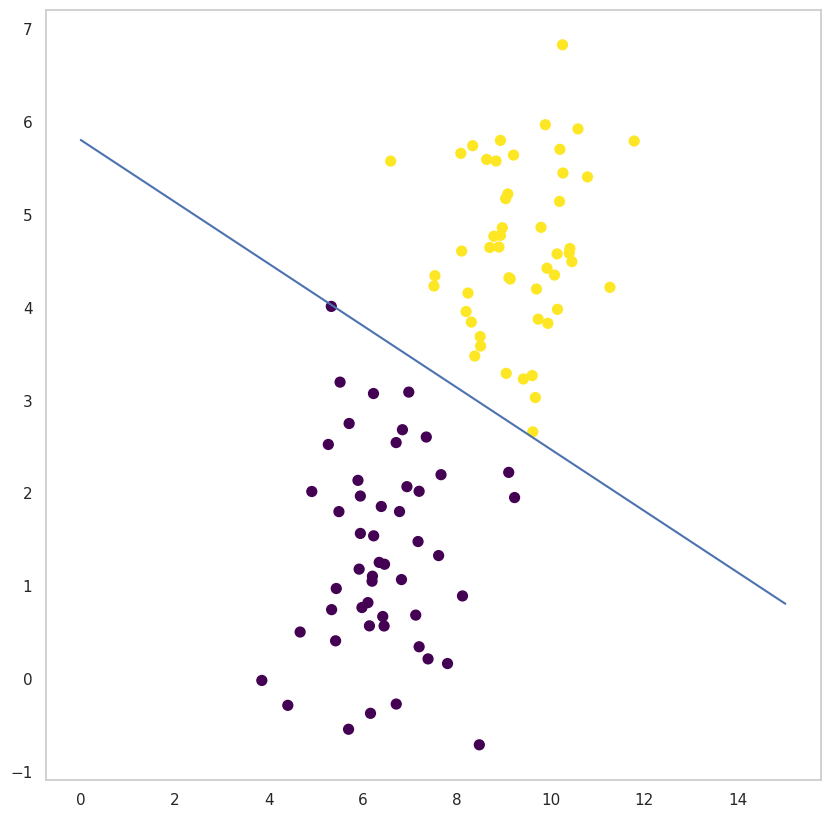

In [13]:
# Import the matplotlib library for visualization
import matplotlib.pyplot as plt

# Set the size of the figure to 10x10 inches
plt.figure(figsize=(10, 10))

# Turn off the grid lines in the plot
plt.grid(False)

# Create a scatter plot of the data points in X, colored by their labels y
# The size of the markers is set to 50
# The colormap is set to 'viridis'
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis')

# Get the final set of weights from the list of weights obtained during the training process
w = weights[-1]

# Generate two points on the x-axis to plot the decision boundary line
x1 = np.linspace(0, 15, 2)

# Calculate the corresponding y-values for the decision boundary line
x2 = -(w[0] * x1 + w[2]) / w[1]

# Plot the decision boundary line using the x and y values
plt.plot(x1, x2)

# Show the plot
plt.show()